# Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.io as pio

pio.templates.default = 'plotly_white'
pd.set_option('display.float_format', '{:.5f}'.format)

# Read data

In [2]:
df = pd.read_csv("../data/interim/loans_int.csv")

/home/dangj/PycharmProjects/fca-takehome-test/venv/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning:

Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.



In [3]:
string_cols = [
    'term',
    'purpose',
    'description',
    'title',
    'home_ownership',
    'employment_length',
    'job_title',
    'loan_status',
    'district',
    'postcode_district'
]

for col in string_cols:
    df[col] = df[col].astype(str)
    df[col] = df[col].str.lower()

# Functions to clean data

In [4]:
def income_cleaner(string):
    if len(string.split(' ')) == 1:
        return float(string)
    if len(string.split(' ')) > 1:
        return float(string.split(' ')[-1])

In [5]:
df['annual_income'] = df['annual_income'].apply(income_cleaner)

# EDA

In [6]:
df.columns

Index(['account_id', 'installment', 'loan_amount', 'interest_rate', 'term',
       'purpose', 'issue_date', 'description', 'title', 'home_ownership',
       'annual_income', 'employment_length', 'job_title',
       'earliest_credit_line', 'public_records', 'last_record_months',
       'last_delinquency_months', 'last_derog_months', 'delinquency_2y',
       'inquiries_6m', 'open_accounts', 'debt_to_income', 'credit_card_usage',
       'credit_card_balance', 'total_current_balance', 'nr_accounts',
       'loan_status', 'amount_payed', 'year', 'district', 'postcode_district',
       'credit_score'],
      dtype='object')

In [7]:
df.describe()

,account_id,installment,loan_amount,interest_rate,annual_income,public_records,last_record_months,last_delinquency_months,last_derog_months,delinquency_2y,inquiries_6m,open_accounts,debt_to_income,credit_card_usage,credit_card_balance,total_current_balance,nr_accounts,amount_payed,year,credit_score
count,237436.00000,237436.00000,237436.00000,237436.00000,237436.00000,237436.00000,29856.00000,106113.00000,46380.00000,237436.00000,237436.00000,237436.00000,237436.00000,237263.00000,237436.00000,181846.00000,237436.00000,237436.00000,237436.00000,237436.00000
mean,14054746.18679,419.15935,13605.86695,13.57396,73547.75905,0.14847,76.41854,35.21030,43.53599,0.25612,0.82765,10.99464,16.52775,53.93434,15285.66142,140553.74097,25.19686,14038.71169,2013.00125,550.46454
std,16334659.99358,245.26228,8143.43826,4.36794,57555.93202,0.44785,27.75100,21.73541,21.62894,0.75575,1.05324,4.92729,7.81166,24.76678,19044.80447,154543.01605,11.78412,9547.78163,1.40937,200.15080
min,125968.00000,19.87000,1000.00000,5.32000,3000.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,0.00000,2009.00000,-345.01161
25%,1590146.50000,240.92000,7375.00000,10.49000,45000.00000,0.00000,55.00000,17.00000,27.00000,0.00000,0.00000,8.00000,10.72000,35.80000,5866.00000,28816.25000,17.00000,6753.26500,2012.00000,415.63352
50%,7000832.00000,365.59500,12000.00000,13.33000,63000.00000,0.00000,78.00000,32.00000,43.00000,0.00000,1.00000,10.00000,16.14000,55.30000,10939.00000,83104.00000,24.00000,11917.47402,2013.00000,550.47158
75%,20369444.25000,547.95000,18375.00000,16.29000,89000.00000,0.00000,101.00000,51.00000,60.00000,0.00000,1.00000,14.00000,21.96000,73.40000,19146.00000,211356.75000,32.00000,19227.20153,2014.00000,685.36892
max,68675893.00000,1409.99000,35000.00000,28.99000,7141778.00000,15.00000,121.00000,152.00000,159.00000,29.00000,8.00000,76.00000,57.14000,892.30000,1743266.00000,8000078.00000,150.00000,57777.57987,2015.00000,1409.03040


## Disitrubtion of data

Start by exploring loan amounts 

1) Understand what amount was mostly issued to borrowers? Most loans were between 10K-20K

2) Which year issued the most loans? 2014-2015 (so more recently!) but the trend has been growing since 2006

3) What is the distribution of loan amounts? Seems like there is a multidistribution, no standard bell curve

Text(0.5, 1.0, 'Loan Amounts')

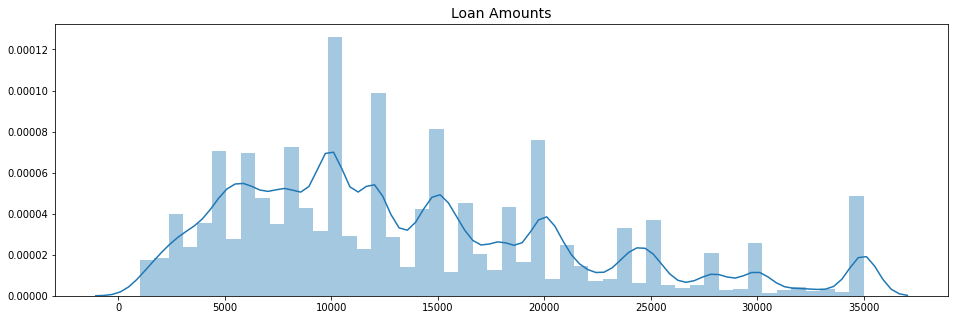

In [8]:
# Amount issued to borrowers

fig, ax = plt.subplots(1, 1, figsize=(16,5))

loan_amount = df["loan_amount"].values
sns.distplot(loan_amount, ax=ax)
ax.set_title("Loan Amounts", fontsize=14)


In [9]:
# Loan amount split by Year

df['issue_date'] = pd.to_datetime(df['issue_date'])
df['issue_year'] = df['issue_date'].dt.year

df_year_amnt = df.groupby('issue_year').count()

fig = go.Figure()

trace_amount = go.Scatter(
    x=df_year_amnt.index, 
    y=df['account_id'],
    name=f'Loan Issuance'
)

fig.add_trace(trace_amount)
fig.update_layout(title=f'Growth of loans issued by year',title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Year'),
    yaxis=dict(title='Loans issued', showgrid=False)
)
fig.layout['hovermode'] = 'x'
fig.show()

Add in loans issued split by terms

## What does a good / bad loan look like?

- Define Good / Bad
- What are the demographics of a Good / Bad consumer 

In [10]:
df['loan_status'].value_counts()

fully paid          206202
charged off          14956
late (> 90 days)      9298
ongoing               5761
default               1219
Name: loan_status, dtype: int64

- Good = Fully paid of loan
- Bad = Charged Off, Late, Default

- Reasoning for Good, it is what we want, company doesn't make a loss
- Reasoning for Bad, Default because consumer fails to pay back debt according to their agreement, Charged-off because the company expects that consumer won't pay back their loan and thus is a few steps ahead of a default, and Late becaue it's a softer version of Default because strictly a consumer failed to pay back according to their agreement, in all these cases the risk of loss is higher 

- charged-off DEPENDS ON THE CHARGE AMOUNT, reason being is that usually the cost is low vs the effort put in / cost of getting cost back

### Loan status by Year and Overall

In [11]:
loan_mapper = {
    'fully paid': 0,
    'charged off': 1,
    'late (> 90 days)': 1,
    'default': 1,
    'ongoing': 2
}

In [12]:
df['class'] = df['loan_status'].map(loan_mapper)

In [13]:
df_loan = df.groupby('class').count()
df_loan.reset_index(inplace=True)

df_loan_yr = df.groupby(['issue_year','class']).count()
df_loan_yr.reset_index(inplace=True)

In [14]:
# Overall proportion of loan status
fig = go.Figure()

labels = {
    'Good': 'rgba(77, 175, 74, 1)',
    'Bad': 'rgba(228, 26, 28, 1)',
    'Ongoing': 'rgba(55, 126, 184, 1)'
}

trace_loan = go.Pie(
    labels=list(labels.keys()),
    values=df_loan['account_id'],
    hole=.5,
    name=f'Loan Statuses'
)

fig.add_trace(trace_loan)
fig.update_traces(marker=dict(colors=list(labels.values())))
fig.update_layout(title=f'Distribution of Loan Statuses between 2009-2015', title_x=0.5)

fig.show()

In [15]:
# See Loan statuses by Year
fig = go.Figure()

years = df.issue_year.unique()
for idx, label in enumerate(labels.keys()):
    trace_amnt = go.Bar(
        name=label,
        x=years,
        y=df_loan_yr[df_loan_yr['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_amnt)

fig.update_layout(title=f'Distribution of Loan Statuses by year', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Year'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

### Loan Status by term

In [16]:
df_loan_term = df.groupby(['term','class']).count()
df_loan_term.reset_index(inplace=True)

In [17]:
# Overall proportion of loan status split by term
fig = go.Figure()

terms = df_loan_term.term.unique()
for idx, label in enumerate(labels.keys()):
    trace_term = go.Bar(
        name=label,
        x=terms,
        y=df_loan_term[df_loan_term['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_term)

fig.update_layout(title=f'Distribution of Loan Statuses by Term', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Loan Terms'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

### Loan Status by region

Caveat - Not all regions could be mapped, in this exercise obtaining data for postcode to county mapping could be found but due to the sheer size, was computationally unfeasible.

18% of the data could not be mapped to a region

#### Importing external data and cleaning it

In [18]:
region_map = pd.read_csv("../data/external/district_mapper.csv")

In [19]:
cols_keep = [
    'LAD17NM',
    'GOR10NM'
]

In [20]:
cleaned_region = region_map[cols_keep]

for col in cols_keep:
    cleaned_region[col] = cleaned_region[col].str.lower()
    cleaned_region[col] = cleaned_region[col].str.strip()

cleaned_region.dropna(inplace=True)
cleaned_region.drop_duplicates(inplace=True,subset=cols_keep)
cleaned_region.columns = ['district','region']

/home/dangj/PycharmProjects/fca-takehome-test/venv/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/dangj/PycharmProjects/fca-takehome-test/venv/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/dangj/PycharmProjects/fca-takehome-test/venv/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

#### EDA of Loans by Region

In [21]:
# merging data with the region mapping
df_with_region = pd.merge(
    left=df.copy(),
    right=cleaned_region,
    on='district',
    how='left'
)

df_region_grouped = df_with_region.groupby(['region','class']).count()[['account_id']]
df_region_grouped.reset_index(inplace=True)

In [22]:
# See Loan statuses by region
fig = go.Figure()

regions = df_region_grouped.region.unique()
for idx, label in enumerate(labels.keys()):
    trace_region = go.Bar(
        name=label,
        x=regions,
        y=df_region_grouped[df_region_grouped['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_region)

fig.update_layout(title=f'Regional Distribution of Loan Statuses by year', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='UK Regions'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

### Loan status by purpose

In [23]:
df_purpose = df.groupby(['purpose','class']).count()
df_purpose.reset_index(inplace=True)

In [24]:
# Looking at class by the purpose
fig = go.Figure()

purpose = df_purpose.purpose.unique()
for idx, label in enumerate(labels.keys()):
    trace_purpose = go.Bar(
        name=label,
        x=purpose,
        y=df_purpose[df_purpose['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_purpose)

fig.update_layout(title=f'Distribution of Loan Statuses by Purpose', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Purpose'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

### Loan status by income banding

In [25]:
def income_bands(income):
    if income <= 20000:
        return '0-20k'
    if 20001 <= income <= 40000:
        return '20k-40k'
    if 40001 <= income <= 60000:
        return '40k-60k'
    if 60001 <= income <= 80000:
        return '60k-80k'
    if income >= 80001:
        return '>80K'

df['income_bands'] = df['annual_income'].apply(income_bands)

In [26]:
df_income_group = df.groupby(['income_bands','class']).count()
df_income_group.reset_index(inplace=True)

In [27]:
# Looking at class by the credit score group
fig = go.Figure()

income_groups = df_income_group.income_bands.unique()
for idx, label in enumerate(labels.keys()):
    trace_income_grp = go.Bar(
        name=label,
        x=income_groups,
        y=df_income_group[df_income_group['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_income_grp)

fig.update_layout(title=f'Distribution of Loan Statuses by Income Bands', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Experian Credit Groups (GBP £)'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

## Credit scores & Finance

- Use Experian Credit grouping to group credit scores as it is more popular as they are more offered to consumers

- This section is more on understanding the risks

In [29]:
def experian_map(score):
    if score <= 560:
        return 'Very Poor'
    if 561 <= score <= 720:
        return 'Poor'
    if 721 <= score <= 880:
        return 'Fair'
    if 881 <= score <= 960:
        return 'Good'
    if 961 <= score <= 999:
        return 'Excellent' 
    
df['experian_group'] = df['credit_score'].apply(experian_map)
df_credit_group = df.groupby(['experian_group','class']).count()
df_credit_group.reset_index(inplace=True)

In [30]:
# Looking at class by the credit score group
fig = go.Figure()

credit_groups = df_credit_group.experian_group.unique()
for idx, label in enumerate(labels.keys()):
    trace_cred_grp = go.Bar(
        name=label,
        x=credit_groups,
        y=df_credit_group[df_credit_group['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_cred_grp)

fig.update_layout(title=f'Distribution of Loan Statuses by Experian Credit Group', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Experian Credit Groups'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

In [41]:
df.groupby(['experian_group','class']).mean()[['interest_rate','annual_income']]

interest_rate  annual_income
experian_group class                              
Excellent      0           13.10774    74972.92389
               1           16.18535    63450.98616
               2           13.35020    69347.17600
Fair           0           13.29734    74248.45628
               1           15.89526    67762.72663
               2           12.74017    77218.33502
Good           0           13.26768    74787.37701
               1           15.81324    69770.58666
               2           12.77640    75933.88651
Poor           0           13.30306    74640.61187
               1           16.00004    67238.39801
               2           13.18595    76287.87087
Very Poor      0           13.28951    73959.82909
               1           15.99553    67330.74854
               2           13.01796    76719.10088

#### Purpose by interest rate

In [31]:
def interest_bands(interest_rate):
    if 5 < interest_rate <= 10:
        return '5% - 10%'
    if 10 < interest_rate <= 15:
        return '10% - 15%'
    if 15 < interest_rate <= 20:
        return '15% - 20%'
    if interest_rate > 20:
        return '>20%'
    
df['interest_rate_band'] = df['interest_rate'].apply(interest_bands)
df_int_group = df.groupby(['interest_rate_band','class']).count()
df_int_group.reset_index(inplace=True)

In [32]:
# Looking at class by the interest rate groups
fig = go.Figure()

int_groups = df_int_group.interest_rate_band.unique()
for idx, label in enumerate(labels.keys()):
    trace_int_grp = go.Bar(
        name=label,
        x=int_groups,
        y=df_int_group[df_int_group['class']==idx].account_id,
        marker_color=labels[label]
    )
    fig.add_trace(trace_int_grp)

fig.update_layout(title=f'Distribution of Loan Statuses by Interest rates', title_x=0.5)
fig.update_layout(
    xaxis=dict(title='Interest Rates'),
    yaxis=dict(title='Loans issued', showgrid=False),
    barmode='stack'
)
fig.layout['hovermode'] = 'x'
fig.show()

#### Debt-to-income split by purpose

- Individuals who are bad (late,default charge off) tend to have larger DTI going up to 20% for debt consolidation which is 5% pts higher than those who have fully paid off their debt

In [45]:
df.groupby(['class','purpose']).mean()[['debt_to_income']]

debt_to_income
class purpose                           
0     car                       12.49255
      credit_card               16.63929
      debt_consolidation        16.96734
      educational               11.13940
      home_improvement          13.37598
      house                     12.12062
      major_purchase            12.35762
      medical                   14.98251
      moving                    14.18759
      other                     14.66841
      renewable_energy          13.85348
      small_business            12.27103
      vacation                  15.25806
      wedding                   13.56072
1     car                       14.77378
      credit_card               19.23559
      debt_consolidation        19.59915
      educational               13.83737
      home_improvement          16.16010
      house                     15.80159
      major_purchase            15.53270
      medical                   17.76150
      moving                    15.92651
      other                     17.81646
      renewable_energy          16.13053
      small_business            14.52827
      vacation                  18.15864
      wedding                   14.13440
2     car                       15.56587
      credit_card               18.76433
      debt_consolidation        19.36511
      home_improvement          15.52812
      house                     16.82688
      major_purchase            15.40452
      medical                   19.12542
      moving                    16.21667
      other                     17.96851
      small_business            13.95058
      vacation                  20.12840
      wedding                   20.79750